In [1]:
%load_ext autoreload
%autoreload 2
from IPython.display import display

In [2]:
import os 

import pickle

import numpy as np

import pandas as pd

import statsmodels.api as sm
from statsmodels.graphics.gofplots import qqplot

import arviz as az
#import bambi as bmb
#from bambi import Prior
import pymc3 as pm

import matplotlib.pyplot as plt
import matplotlib
import seaborn as sns

from modules.models.stats import LMMPerformance

WARNING (theano.configdefaults): g++ not available, if using conda: `conda install m2w64-toolchain`
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\theano\configdefaults.py:560: UserWarning: DeprecationWarning: there is no c++ compiler.This is deprecated and with Theano 0.11 a c++ compiler will be mandatory
  warnings.warn("DeprecationWarning: there is no c++ compiler."
WARNING (theano.configdefaults): g++ not detected ! Theano will be unable to execute optimized C-implementations (for both CPU and GPU) and will default to Python implementations. Performance will be severely degraded. To remove this warning, set Theano flags cxx to an empty string.
WARNING (theano.tensor.blas): Using NumPy C-API based implementation for BLAS functions.


In [3]:
pd.set_option('display.max_rows', None)

def sns_styleset():
    sns.set(context='paper', style='ticks', font='DejaVu Sans')
    matplotlib.rcParams['figure.dpi']        = 300
    matplotlib.rcParams['axes.linewidth']    = 1
    matplotlib.rcParams['xtick.major.width'] = 1
    matplotlib.rcParams['ytick.major.width'] = 1
    matplotlib.rcParams['xtick.major.size']  = 3
    matplotlib.rcParams['ytick.major.size']  = 3
    matplotlib.rcParams['xtick.minor.size']  = 2
    matplotlib.rcParams['ytick.minor.size']  = 2
    matplotlib.rcParams['font.size']         = 13
    matplotlib.rcParams['axes.titlesize']    = 13
    matplotlib.rcParams['axes.labelsize']    = 13
    matplotlib.rcParams['legend.fontsize']   = 13
    matplotlib.rcParams['xtick.labelsize']   = 13
    matplotlib.rcParams['ytick.labelsize']   = 13
    
sns_styleset()

# Load Data

In [4]:
final_results = []
for boot in range(10):
    
    fold_n = np.random.choice([i for i in range(4)])

    final_results.append(
        pd.read_csv(f'results\\tables\\models_performance\\models_performance_fold_{fold_n}.csv')
    )
    final_results[boot]['fold_n'] = boot

final_results = pd.concat(final_results, ignore_index=True)
final_results = final_results.dropna()
final_results['time_epochs'] = final_results['fitting_time'] / final_results['epochs']
targets = final_results['target'].unique()
comparisons = [
    ('Lag 1', 'Median'), 
    ('Median', 'ENet'), 
    ('ENet', 'MLP'), 
    ('MLP','RNN')
]

final_results["value"] = final_results["value"] * 100

#final_results.to_csv('results\\tables\\models_performance\\models_performance_total.csv')

In [5]:
collapsed_target = final_results.groupby(['Model', 'Session', 'context', 'fold_n'])['value'].sum().reset_index()
collapsed_target["value"] = collapsed_target["value"] / 5
collapsed_time = final_results.groupby(['Model', 'target', 'fold_n', 'context'])['value'].mean().reset_index()
collapsed_context = final_results.groupby(['Model', 'target', 'fold_n', 'Session'])['value'].mean().reset_index()
collapsed_anova = collapsed_target.groupby(['Model', 'fold_n'])['value'].mean().reset_index()

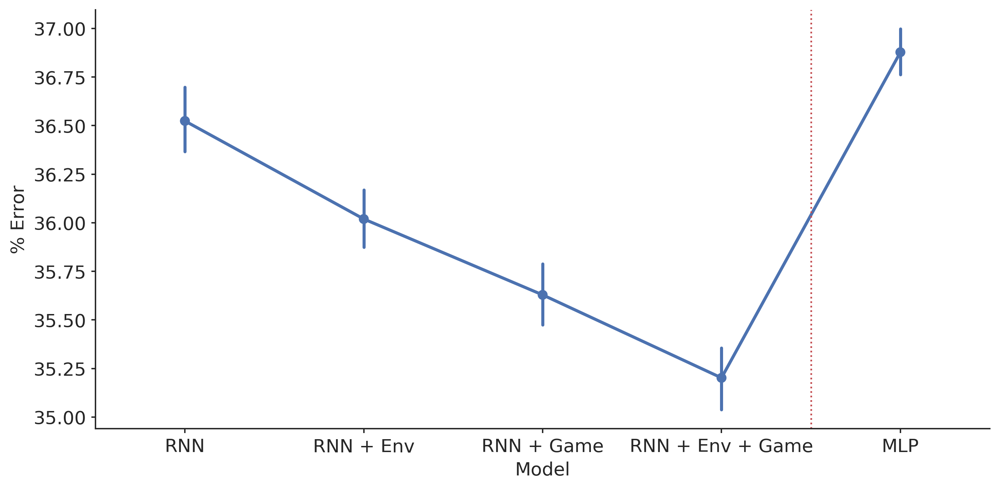

In [6]:
plt.figure(figsize=(10, 5))
ax = sns.pointplot(
    x='Model', 
    y='value', 
    data=collapsed_target, 
    order=['RNN', 'RNN_env', 'RNN_even', 'RNN_env_even', 'MLP']
)
plt.ylabel('% Error')
plt.axvline(
    3.5,
    c='r',
    linestyle=':'
)
plt.xticks(
    [i for i in range(5)],
    ['RNN', 'RNN + Env', 'RNN + Game', 'RNN + Env + Game', 'MLP']
)
sns.despine()
plt.tight_layout()

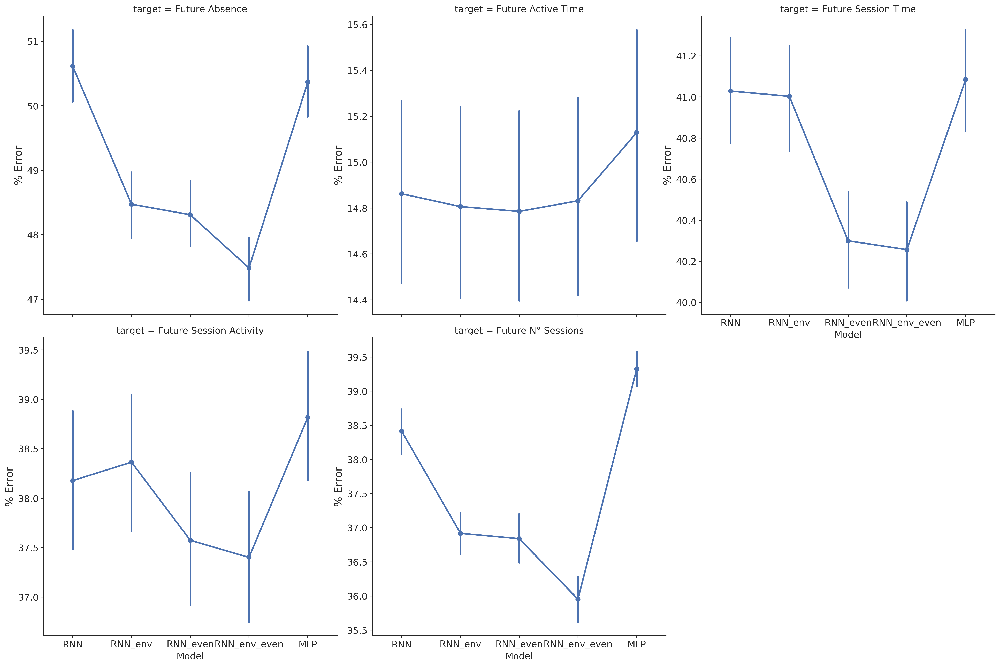

In [7]:
fig = sns.catplot(
    x="Model", 
    y="value",
    col="target",
    data=final_results, 
    order=['RNN', 'RNN_env', 'RNN_even', 'RNN_env_even',  'MLP'],
    kind="point",
    height=6.5, 
    sharey=False,
    col_wrap=3,
)
for ax in fig.axes.flatten():
    ax.set_ylabel('% Error', fontsize=15)
plt.show()

# Performance Visualization

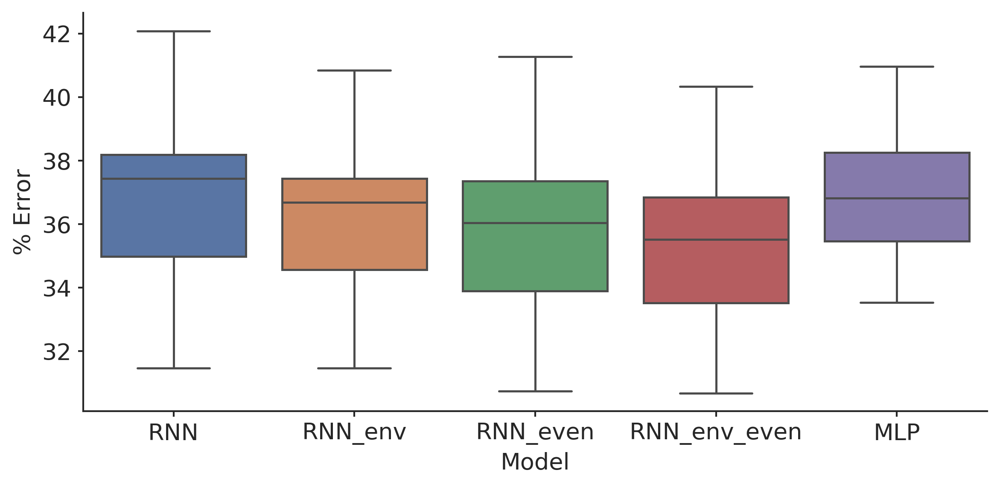

In [7]:
plt.figure(figsize=(8, 4))
ax = sns.boxplot(
    x='Model', 
    y='value', 
    data=collapsed_target, 
    order=['RNN', 'RNN_env', 'RNN_even', 'RNN_env_even', 'MLP']
)
plt.ylabel('% Error')
sns.despine()
plt.tight_layout()
# plt.savefig(
#     'results\\figures\\models_performance\\models_comparison_collapsed.png',
#     dpi=500,
#     bbox_inches='tight'
# )
plt.show()

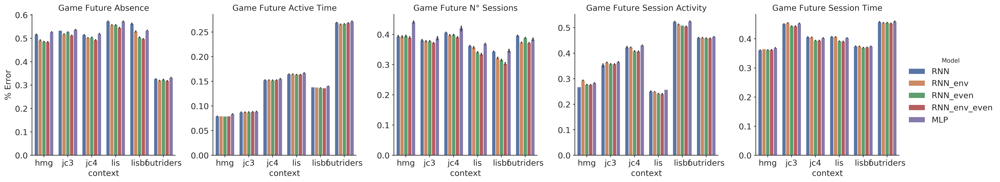

In [20]:
box_plots = sns.catplot(
    x='context', 
    y='value', 
    col='target',
    hue='Model',
    kind='bar',
    data=collapsed_time,
    hue_order=['RNN', 'RNN_env', 'RNN_even', 'RNN_env_even', 'MLP'],
    col_wrap=5,
    height=4,
    sharey=False
)
box_plots.set_titles('Game {col_name}')
box_plots.set_ylabels('% Error')
plt.show()

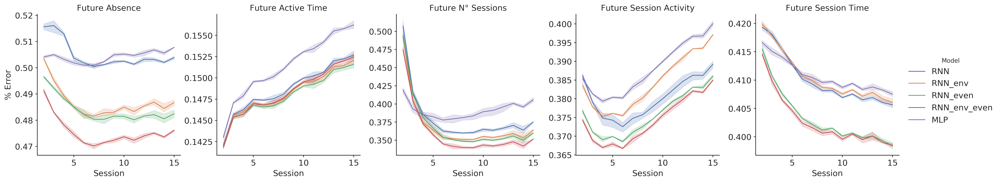

In [21]:
line_plots = sns.relplot(
    x='Session', 
    y='value', 
    hue='Model',
    col='target',
    kind='line',
    hue_order=['RNN', 'RNN_env', 'RNN_even', 'RNN_env_even', 'MLP'],
    data=collapsed_context,
    col_wrap=5,
    height=4,
    facet_kws={'sharey': False}
)
line_plots.set_titles('{col_name}')
line_plots.set_ylabels('% Error')
plt.show()

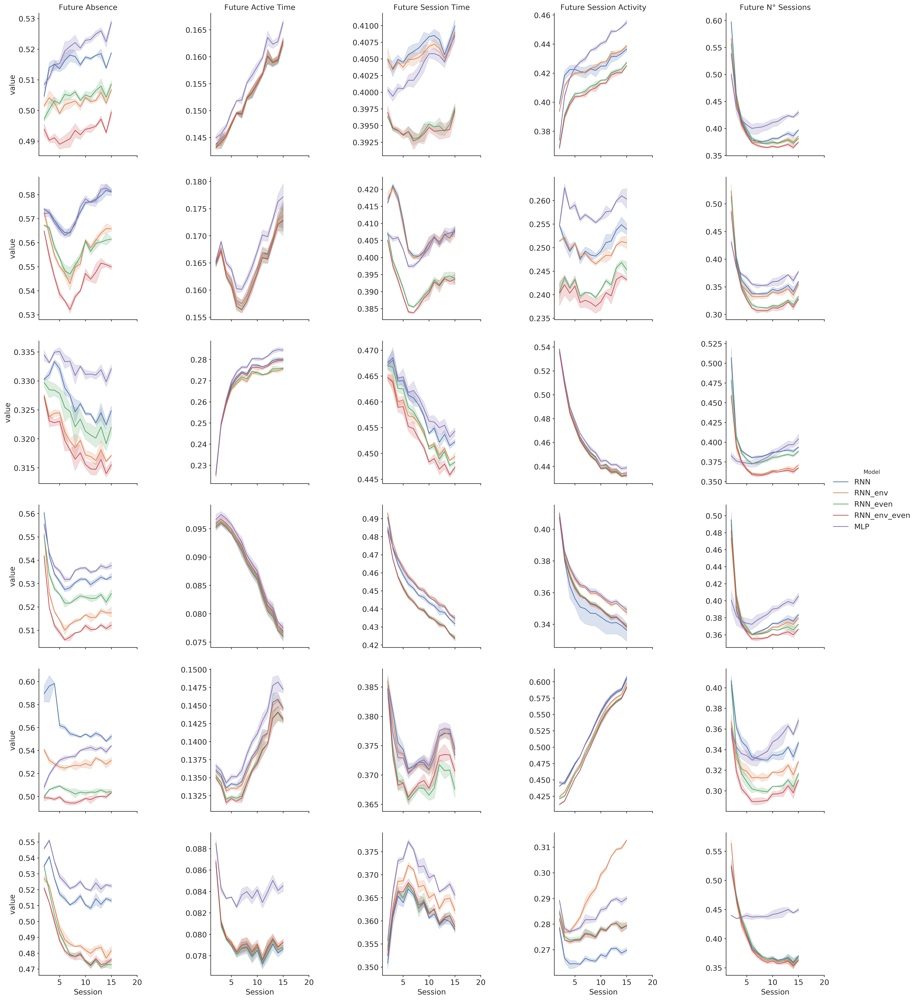

In [22]:
line_plots = sns.relplot(
    x='Session', 
    y='value', 
    hue='Model',
    col='target',
    row='context',
    kind='line',
    hue_order=['RNN', 'RNN_env', 'RNN_even', 'RNN_env_even', 'MLP'],
    data=final_results,
    height=4,
    facet_kws={'sharey': False}
)
line_plots.set_titles('')

for column, target in enumerate([
    'Future Absence',    
    'Future Active Time',
    'Future Session Time',
    'Future Session Activity',
    'Future N° Sessions'
]):
    
    line_plots.axes[0, column].set_title(target)
    
# for row, game in enumerate([
#     'hms',
#     'jc3',
#     'lis',
#     'lisbf',
#     'jc4',
#     'hmg'
# ]):
#     line_plots.axes[row, 0].set_ylabel(f'Loss Game {game}')

plt.xlim(1, 20)
plt.show()

# Statistical Analysis: Linear Mixed Model

# Frequentist

In [10]:
vcf = {'Session': '0 + C(Session)', 'context': '0 + C(context)', 'fold_n': '0 + C(fold_n)'}
final_results['group'] = 1
collapsed_target['group'] =1

contrasts = np.array(
    [
        [0, 1, -1, 0, 0], # RNN - RNN env
        [0, 1, 0, -1, 0], # RNN - RNN env even
        [0, 1, 0, 0, -1], # RNN - RNN even
        [0, 0, 1, -1, 0], # RNN env - RNN env even
        [0, 0, 1, 0, -1], # RNN env - RNN even
        [0, 0, 0, 1, -1]  # RNN env even - RNN even
    ]
)

### LMM Collapsed Target

In [11]:
model = sm.MixedLM.from_formula(
    "value ~ C(Model, Treatment(reference='MLP'))", 
    groups='group',                                                    
    vc_formula=vcf, 
    re_formula='0', 
    data=collapsed_target
)                                                   
result = model.fit()
display(result.summary())

c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:1634: UserWarning: Random effects covariance is singular
  warnings.warn(msg)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2202: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2261: Co

<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Mixed Linear Model Regression Results
================================================================================================
Model:                          MixedLM              Dependent Variable:              value     
No. Observations:               4200                 Method:                          REML      
No. Groups:                     1                    Scale:                           0.7654    
Min. group size:                4200                 Log-Likelihood:                  -5464.8655
Max. group size:                4200                 Converged:                       Yes       
Mean group size:                4200.0                                                          
------------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------------------------------------------------
Intercept                                            36.945    0.888  41.613 0.000 35.205 38.685
C(Model, Treatment(reference='MLP'))[T.RNN]          -0.326    0.043  -7.627 0.000 -0.409 -0.242
C(Model, Treatment(reference='MLP'))[T.RNN_env]      -1.031    0.043 -24.163 0.000 -1.115 -0.948
C(Model, Treatment(reference='MLP'))[T.RNN_env_even] -1.759    0.043 -41.214 0.000 -1.843 -1.676
C(Model, Treatment(reference='MLP'))[T.RNN_even]     -1.383    0.043 -32.398 0.000 -1.467 -1.299
Session Var                                           0.611    0.273                            
context Var                                           4.462    3.207                            
fold_n Var                                            0.000                                     
================================================================================================

"""

In [25]:
result.t_test(contrasts)

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
c0             0.0248      0.002     11.591      0.000       0.021       0.029
c1             0.0635      0.002     29.663      0.000       0.059       0.068
c2             0.0441      0.002     20.609      0.000       0.040       0.048
c3             0.0387      0.002     18.072      0.000       0.035       0.043
c4             0.0193      0.002      9.018      0.000       0.015       0.024
c5            -0.0194      0.002     -9.054      0.000      -0.024      -0.015

### LMM Exploded

In [27]:
for target in final_results['target'].unique():
    
    print(target)
    
    data = final_results[final_results['target'] == target]
    model = sm.MixedLM.from_formula(
        "value ~ C(Model, Treatment(reference='MLP') )", 
        groups='fold_n',                                                    
        vc_formula=vcf, 
        re_formula='0', 
        data=data
    )                                                   
    result = model.fit()
    display(result.summary())
    display(result.t_test(contrasts))

Future Absence


c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2202: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Mixed Linear Model Regression Results
================================================================================================
Model:                           MixedLM              Dependent Variable:              value    
No. Observations:                1680                 Method:                          REML     
No. Groups:                      4                    Scale:                           0.0001   
Min. group size:                 420                  Log-Likelihood:                  5025.6621
Max. group size:                 420                  Converged:                       Yes      
Mean group size:                 420.0                                                          
------------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------------------------------------------------
Intercept                                             0.504    0.016  31.359 0.000  0.472  0.535
C(Model, Treatment(reference='MLP'))[T.RNN]           0.002    0.001   1.904 0.057 -0.000  0.003
C(Model, Treatment(reference='MLP'))[T.RNN_env]      -0.017    0.001 -20.303 0.000 -0.019 -0.016
C(Model, Treatment(reference='MLP'))[T.RNN_env_even] -0.029    0.001 -34.083 0.000 -0.031 -0.027
C(Model, Treatment(reference='MLP'))[T.RNN_even]     -0.019    0.001 -22.887 0.000 -0.021 -0.018
Session Var                                           0.000    0.000                            
context Var                                           0.006    0.156                            
fold_n Var                                            0.000                                     
================================================================================================

"""

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
c0             0.0189      0.001     22.207      0.000       0.017       0.021
c1             0.0306      0.001     35.987      0.000       0.029       0.032
c2             0.0211      0.001     24.791      0.000       0.019       0.023
c3             0.0117      0.001     13.780      0.000       0.010       0.013
c4             0.0022      0.001      2.584      0.010       0.001       0.004
c5            -0.0095      0.001    -11.196      0.000      -0.011      -0.008

Future Active Time


c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2202: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Mixed Linear Model Regression Results
===============================================================================================
Model:                          MixedLM              Dependent Variable:              value    
No. Observations:               1680                 Method:                          REML     
No. Groups:                     4                    Scale:                           0.0001   
Min. group size:                420                  Log-Likelihood:                  5742.9446
Max. group size:                420                  Converged:                       Yes      
Mean group size:                420.0                                                          
-----------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------------------------------------
Intercept                                             0.151    0.013 11.680 0.000  0.126  0.177
C(Model, Treatment(reference='MLP'))[T.RNN]          -0.003    0.001 -4.818 0.000 -0.004 -0.002
C(Model, Treatment(reference='MLP'))[T.RNN_env]      -0.003    0.001 -5.731 0.000 -0.004 -0.002
C(Model, Treatment(reference='MLP'))[T.RNN_env_even] -0.003    0.001 -5.475 0.000 -0.004 -0.002
C(Model, Treatment(reference='MLP'))[T.RNN_even]     -0.003    0.001 -6.264 0.000 -0.005 -0.002
Session Var                                           0.000    0.000                           
context Var                                           0.004    0.157                           
fold_n Var                                            0.000                                    
===============================================================================================

"""

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
c0             0.0005      0.001      0.913      0.361      -0.001       0.002
c1             0.0004      0.001      0.656      0.512      -0.001       0.001
c2             0.0008      0.001      1.446      0.148      -0.000       0.002
c3            -0.0001      0.001     -0.256      0.798      -0.001       0.001
c4             0.0003      0.001      0.533      0.594      -0.001       0.001
c5             0.0004      0.001      0.790      0.430      -0.001       0.002

Future Session Time


c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2202: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Mixed Linear Model Regression Results
================================================================================================
Model:                           MixedLM              Dependent Variable:              value    
No. Observations:                1680                 Method:                          REML     
No. Groups:                      4                    Scale:                           0.0001   
Min. group size:                 420                  Log-Likelihood:                  5720.7995
Max. group size:                 420                  Converged:                       Yes      
Mean group size:                 420.0                                                          
------------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------------------------------------------------
Intercept                                             0.411    0.007  56.116 0.000  0.396  0.425
C(Model, Treatment(reference='MLP'))[T.RNN]          -0.001    0.001  -1.061 0.289 -0.002  0.001
C(Model, Treatment(reference='MLP'))[T.RNN_env]      -0.000    0.001  -0.533 0.594 -0.001  0.001
C(Model, Treatment(reference='MLP'))[T.RNN_env_even] -0.008    0.001 -14.519 0.000 -0.009 -0.007
C(Model, Treatment(reference='MLP'))[T.RNN_even]     -0.007    0.001 -13.273 0.000 -0.009 -0.006
Session Var                                           0.000    0.000                            
context Var                                           0.001    0.049                            
fold_n Var                                            0.000                                     
================================================================================================

"""

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
c0            -0.0003      0.001     -0.528      0.598      -0.001       0.001
c1             0.0075      0.001     13.458      0.000       0.006       0.009
c2             0.0068      0.001     12.212      0.000       0.006       0.008
c3             0.0078      0.001     13.986      0.000       0.007       0.009
c4             0.0071      0.001     12.740      0.000       0.006       0.008
c5            -0.0007      0.001     -1.246      0.213      -0.002       0.000

Future Session Activity


c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2202: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2202: ConvergenceWarning: Retrying MixedLM optimization with cg
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood

<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Mixed Linear Model Regression Results
===============================================================================================
Model:                          MixedLM              Dependent Variable:              value    
No. Observations:               1680                 Method:                          REML     
No. Groups:                     4                    Scale:                           0.0008   
Min. group size:                420                  Log-Likelihood:                  3505.6885
Max. group size:                420                  Converged:                       No       
Mean group size:                420.0                                                          
-----------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.   z    P>|z| [0.025 0.975]
-----------------------------------------------------------------------------------------------
Intercept                                             0.388    0.025 15.619 0.000  0.340  0.437
C(Model, Treatment(reference='MLP'))[T.RNN]          -0.008    0.002 -3.799 0.000 -0.012 -0.004
C(Model, Treatment(reference='MLP'))[T.RNN_env]      -0.004    0.002 -2.012 0.044 -0.008 -0.000
C(Model, Treatment(reference='MLP'))[T.RNN_env_even] -0.014    0.002 -6.769 0.000 -0.019 -0.010
C(Model, Treatment(reference='MLP'))[T.RNN_even]     -0.012    0.002 -5.805 0.000 -0.017 -0.008
Session Var                                           0.000                                    
context Var                                           0.011    0.120                           
fold_n Var                                            0.001                                    
===============================================================================================

"""

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
c0            -0.0038      0.002     -1.786      0.074      -0.008       0.000
c1             0.0063      0.002      2.971      0.003       0.002       0.011
c2             0.0043      0.002      2.007      0.045    9.98e-05       0.008
c3             0.0101      0.002      4.757      0.000       0.006       0.014
c4             0.0081      0.002      3.793      0.000       0.004       0.012
c5            -0.0021      0.002     -0.964      0.335      -0.006       0.002

Future N° Sessions


c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\base\model.py:568: ConvergenceWarning: Maximum Likelihood optimization failed to converge. Check mle_retvals
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2202: ConvergenceWarning: Retrying MixedLM optimization with lbfgs
  ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2237: ConvergenceWarning: The MLE may be on the boundary of the parameter space.
  warnings.warn(msg, ConvergenceWarning)
c:\users\penthotal\appdata\local\programs\python\python36\lib\site-packages\statsmodels\regression\mixed_linear_model.py:2261: ConvergenceWarning: The Hessian matrix at the estimated parameter values is not positive definite.
  warnings.warn(msg, ConvergenceWarning)


<class 'statsmodels.iolib.summary2.Summary'>
"""
                             Mixed Linear Model Regression Results
================================================================================================
Model:                           MixedLM              Dependent Variable:              value    
No. Observations:                1680                 Method:                          REML     
No. Groups:                      4                    Scale:                           0.0005   
Min. group size:                 420                  Log-Likelihood:                  3806.9286
Max. group size:                 420                  Converged:                       Yes      
Mean group size:                 420.0                                                          
------------------------------------------------------------------------------------------------
                                                     Coef.  Std.Err.    z    P>|z| [0.025 0.975]
------------------------------------------------------------------------------------------------
Intercept                                             0.390    0.007  52.420 0.000  0.376  0.405
C(Model, Treatment(reference='MLP'))[T.RNN]          -0.007    0.002  -4.086 0.000 -0.010 -0.004
C(Model, Treatment(reference='MLP'))[T.RNN_env]      -0.019    0.002 -11.038 0.000 -0.022 -0.016
C(Model, Treatment(reference='MLP'))[T.RNN_env_even] -0.030    0.002 -17.352 0.000 -0.033 -0.027
C(Model, Treatment(reference='MLP'))[T.RNN_even]     -0.021    0.002 -12.142 0.000 -0.024 -0.018
Session Var                                           0.001    0.010                            
context Var                                           0.001    0.011                            
fold_n Var                                            0.000                                     
================================================================================================

"""

<class 'statsmodels.stats.contrast.ContrastResults'>
                             Test for Constraints                             
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
c0             0.0120      0.002      6.952      0.000       0.009       0.015
c1             0.0229      0.002     13.266      0.000       0.020       0.026
c2             0.0139      0.002      8.056      0.000       0.011       0.017
c3             0.0109      0.002      6.314      0.000       0.008       0.014
c4             0.0019      0.002      1.104      0.270      -0.001       0.005
c5            -0.0090      0.002     -5.210      0.000      -0.012      -0.006

# Bayesian

In [11]:
model = LMMPerformance(
    df=final_results, 
    models_column='Model', 
    contexts_column='context', 
    time_column='Session',
    fold_column='fold_n', 
    targets_column='target', 
    outcomes_column='value', 
    robust=True
)
model.analyze(targets=['Future Active Time'], draws=2000, tune=1000, target_accept=0.9)

TypeError: __init__() got an unexpected keyword argument 'coords'

In [ ]:
pm.summary(model.Future_Absence)

C:\Users\penthotal\miniconda3\envs\bayes_env\lib\site-packages\arviz\data\io_pymc3.py:96: FutureWarning: Using `from_pymc3` without the model will be deprecated in a future release. Not using the model will return less accurate and less useful results. Make sure you use the model argument or call from_pymc3 within a model context.
  warnings.warn(


# Final Plot

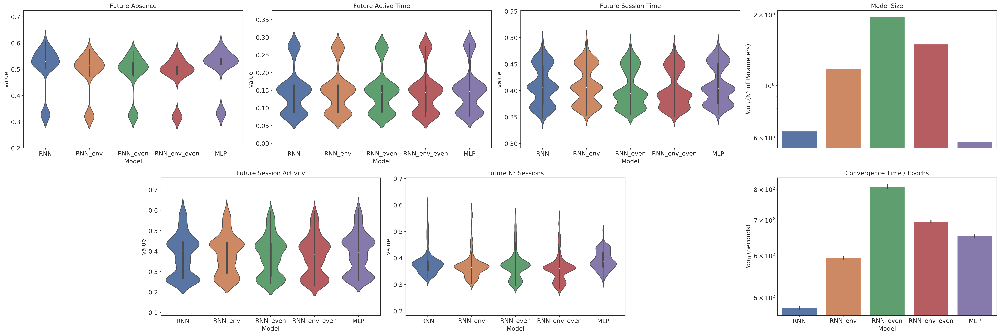

In [27]:
fig = plt.figure(constrained_layout=True, figsize=(30, 10))
spec = fig.add_gridspec(2, 8)


axs_metrics = [
    fig.add_subplot(spec[0, 0:2]),
    fig.add_subplot(spec[0, 2:4]),
    fig.add_subplot(spec[0, 4:6]),
    fig.add_subplot(spec[1, 1:3]),
    fig.add_subplot(spec[1, 3:5])
]
ax_size = fig.add_subplot(spec[0, 6:8])
ax_time = fig.add_subplot(spec[1, 6:8])

########################################################################

index=0
for target, ax_metric in zip(targets, axs_metrics):

    sns.violinplot(
        x='Model',
        y='value',
        data=final_results[final_results['target'] == target],
        order=['RNN', 'RNN_env', 'RNN_even', 'RNN_env_even', 'MLP'],
        ax=ax_metric,
        showfliers=True
    )
    y_limits = ax_metric.get_ylim()
    
    ax_metric.set_title(target)
    if index == 0:
        ax.set_ylabel('% Error')
        ax.set_xlabel('')
        ax.set_xticks([])
    elif index == 3:
         ax.set_ylabel('% Error')
    elif index in [1, 2]:
        ax.set_ylabel('')
        ax.set_xlabel('')
        ax.set_xticks([])
    else:
        ax.set_ylabel('')
    ax_metric.margins(y=0.20)
    
    index+=1

sns.barplot(
    x='Model',
    y='parameters',
    data=final_results,
    order=['RNN', 'RNN_env', 'RNN_even', 'RNN_env_even', 'MLP'],
    ax=ax_size
)
ax_size.set_xlabel('')
ax_size.set_xticks([])
ax_size.set_yscale('log')
ax_size.set_title('Model Size')
ax_size.set_ylabel('$log_{10}$(N° of Parameters)')

sns.barplot(
    x='Model',
    y='time_epochs',
    data=final_results,
    order=['RNN', 'RNN_env', 'RNN_even', 'RNN_env_even', 'MLP'],
    ax=ax_time
)
ax_time.set_xlabel('Model')
ax_time.set_yscale('log')
ax_time.set_title('Convergence Time / Epochs')
ax_time.set_ylabel('$log_{10}$(Seconds)')

plt.show()
# plt.savefig(
#     'results\\figures\\models_performance\\models_comparison.svg',
#     dpi=500,
#     bbox_inches='tight'
# )